Source: /Users/liulei/Desktop/SEMPO_copy0707/test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/chem_accum_crossvar_relation_pretrain_proto_k3_prefix_fixed.npz_ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/train_step0/val_residual_steps.npz
Train sites (15): ['Bruce Plateau', 'FB9814', 'ITASE-00-4', 'ITASE-01-3', 'ITASE-00-3', 'SPOLE 0EW', 'Fimbulisen s100', 'UP-C', 'DIV2010', 'ITASE-01-1', 'Gomez', 'ITASE-01-2', 'Law Dome (2015)', 'RIDS-A', 'FB9809']
No adaptation. Plot legends use the displayed window MAE.


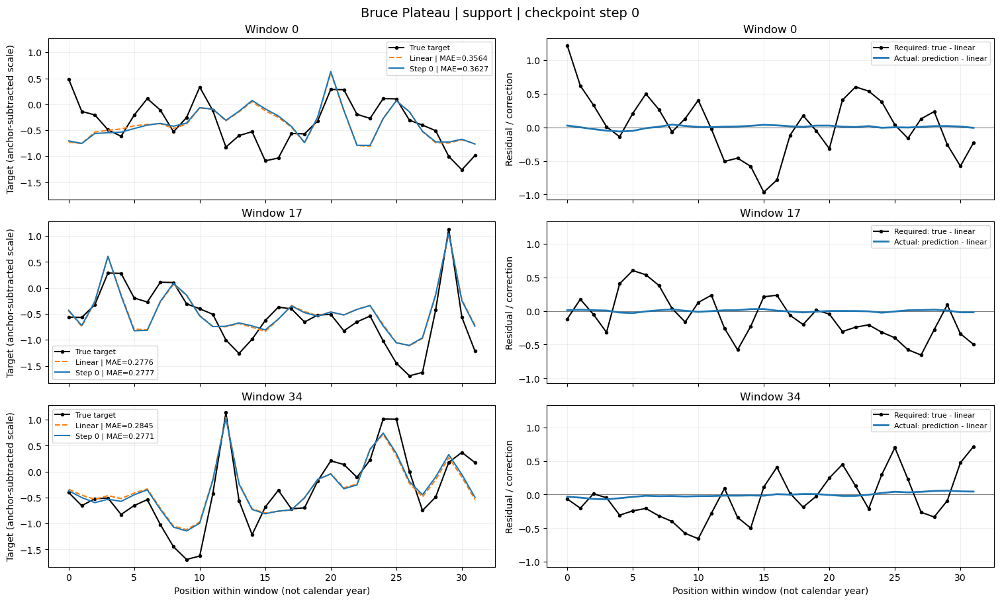

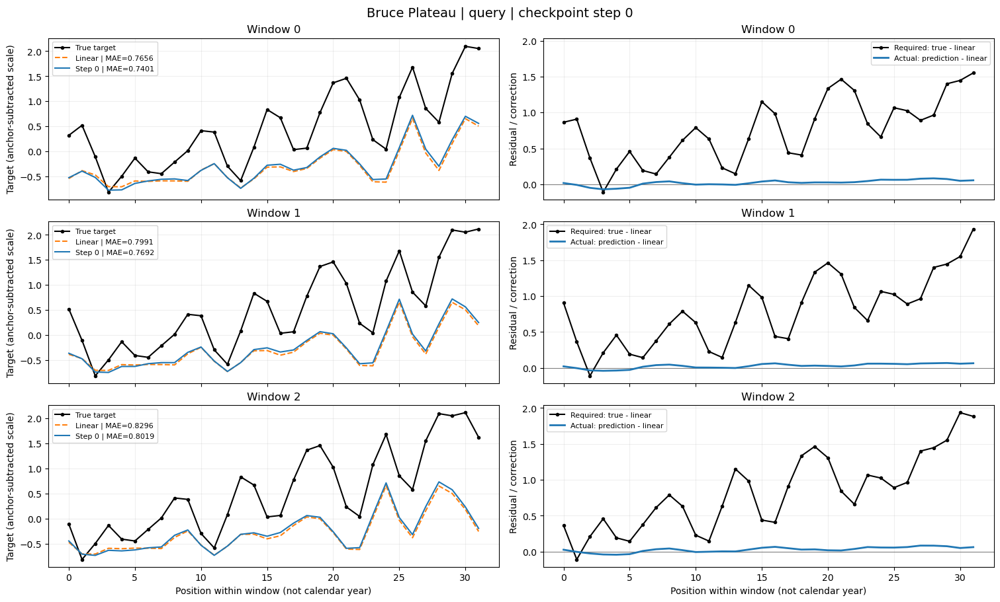

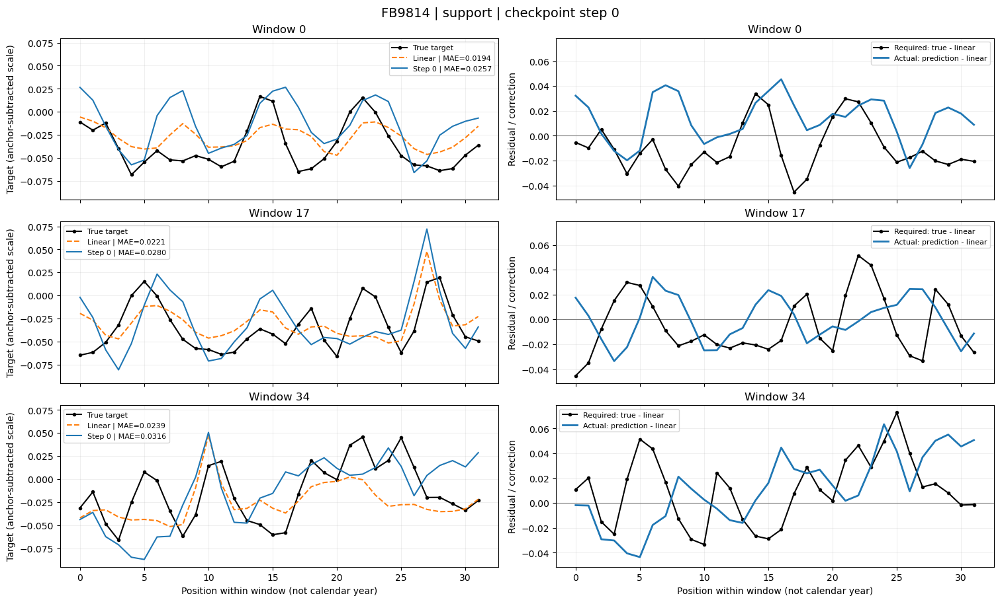

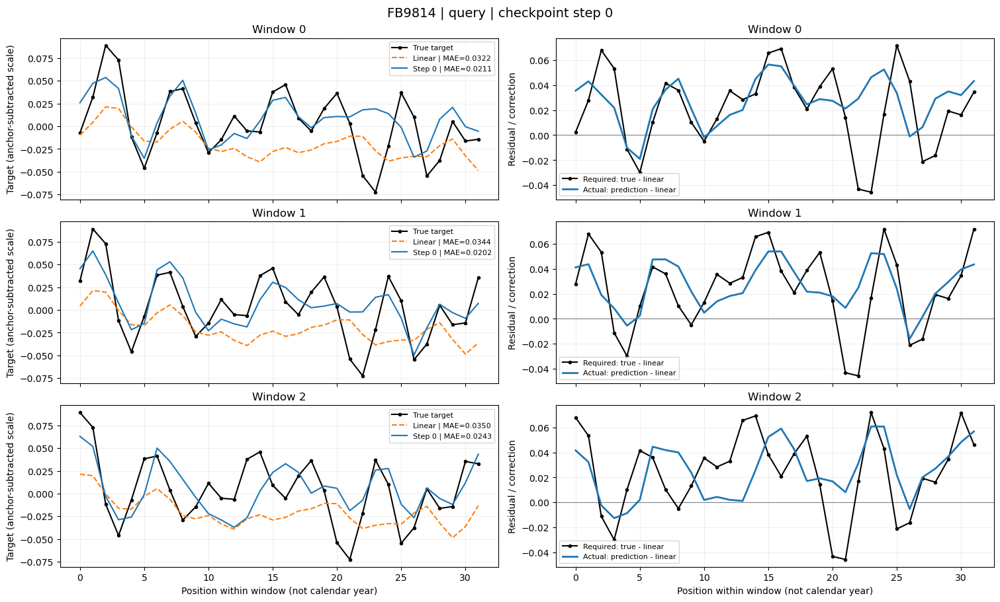

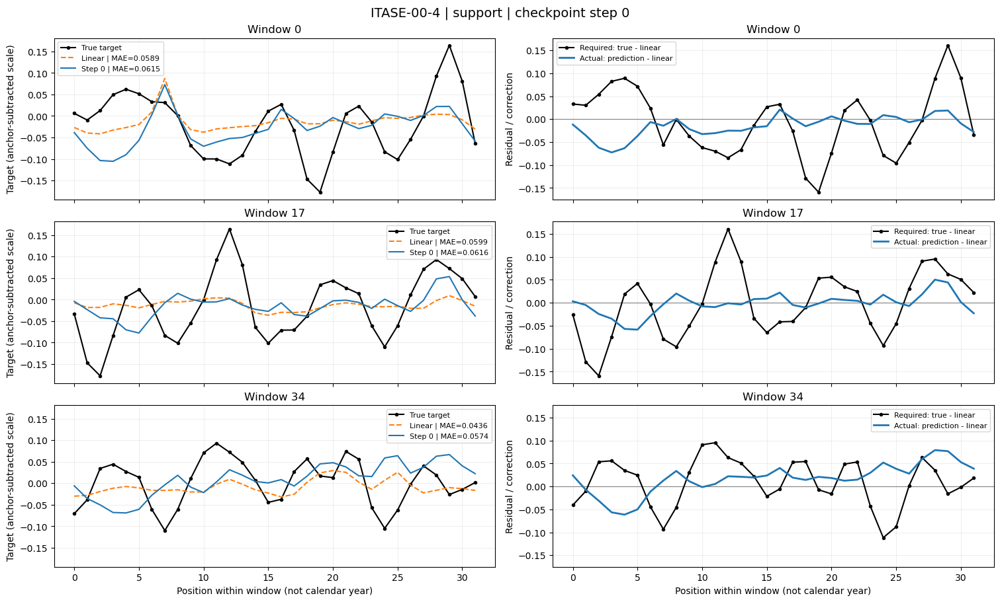

...

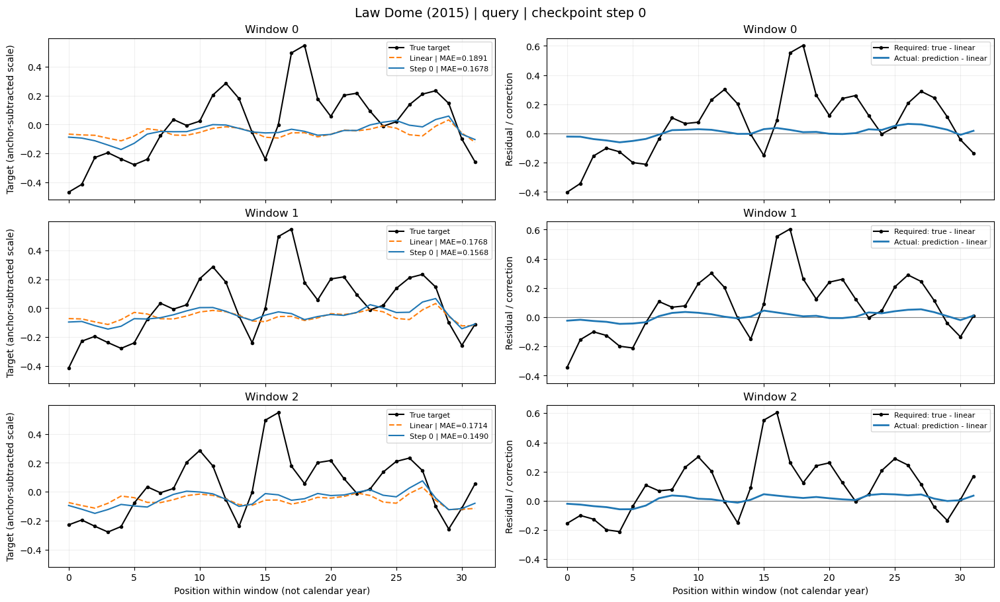

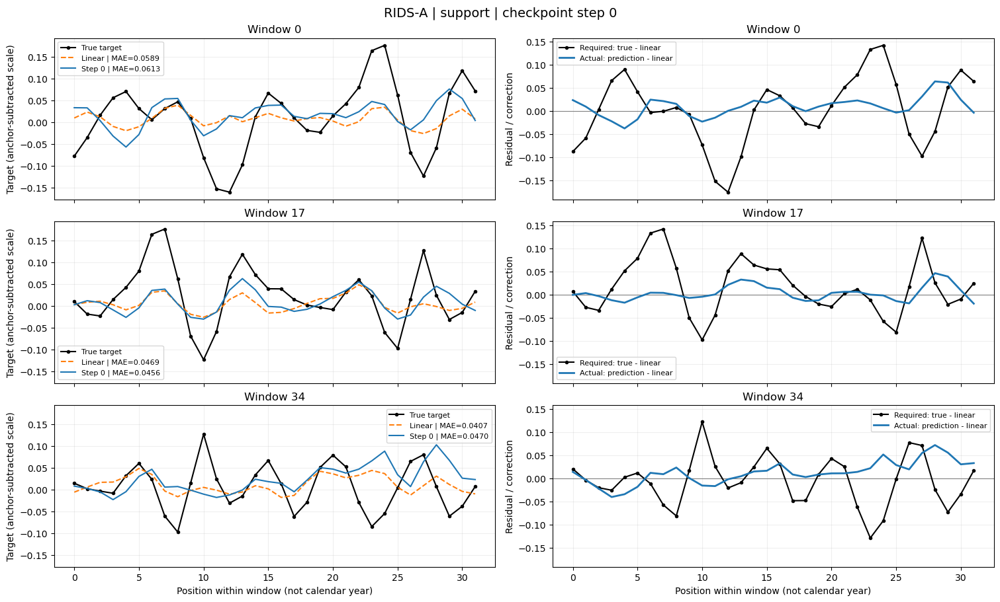

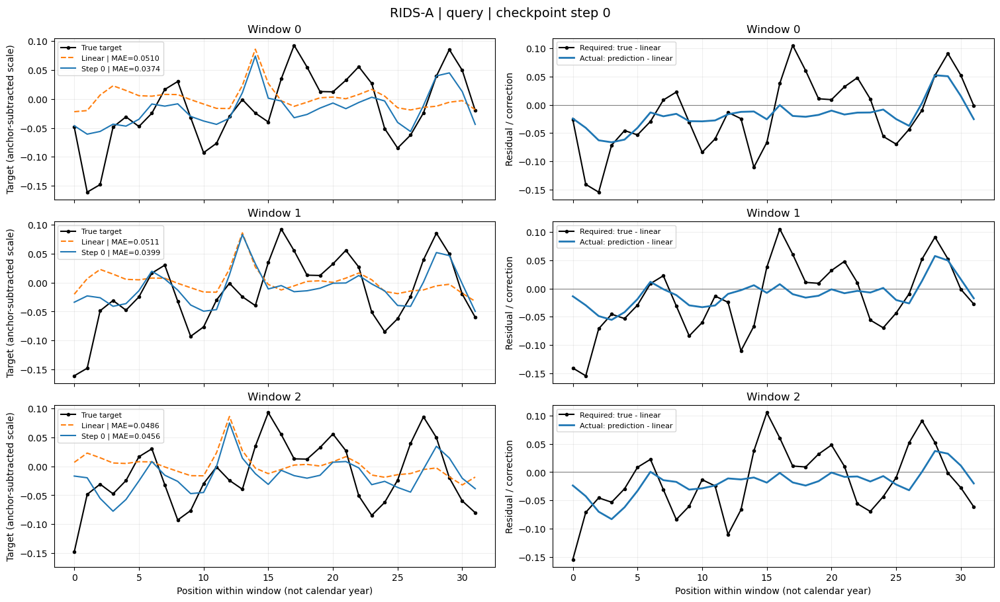

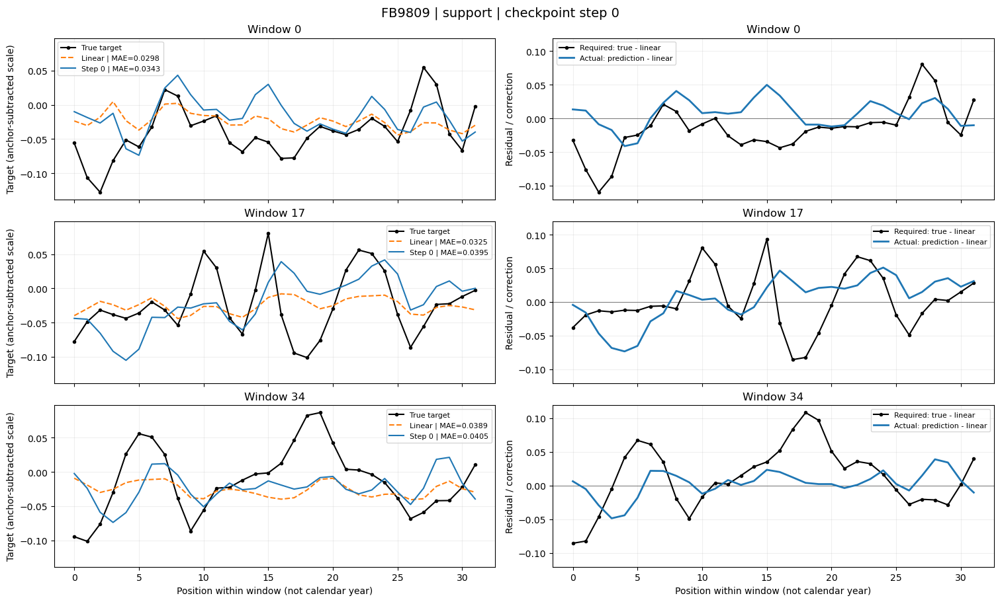

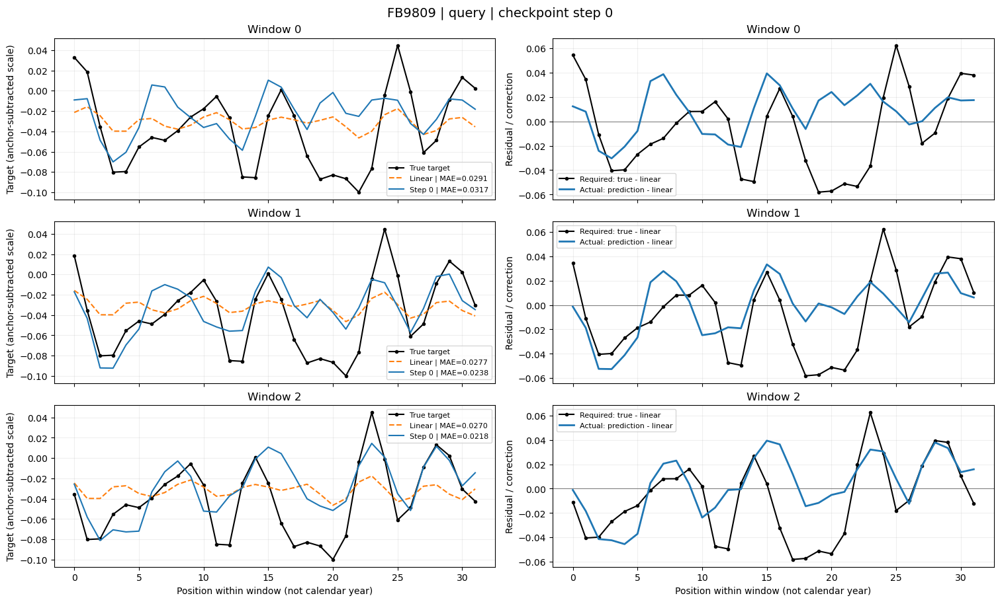


ALL-window MAE (not just the displayed windows)
Site               Split        Linear      Step0
Bruce Plateau      support     0.28902    0.28878
Bruce Plateau      query       0.79806    0.77039
FB9814             support     0.02211    0.02500
FB9814             query       0.03387    0.02188
ITASE-00-4         support     0.05452    0.05477
ITASE-00-4         query       0.04041    0.04183
ITASE-01-3         support     0.06445    0.06926
ITASE-01-3         query       0.09255    0.08296
ITASE-00-3         support     0.06329    0.06985
ITASE-00-3         query       0.14118    0.13164
SPOLE 0EW          support     0.02511    0.03342
SPOLE 0EW          query       0.04276    0.04856
Fimbulisen s100    support     0.11162    0.11518
Fimbulisen s100    query       0.29290    0.25607
UP-C               support     0.03831    0.04027
UP-C               query       0.04827    0.03823
DIV2010            support     0.07068    0.07267
DIV2010            query       0.10261    0.09370
I

In [4]:
# Train sites, frozen checkpoint: run this cell independently.
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

root = Path('/Users/liulei/Desktop/SEMPO_copy0707')
# npz_path = root / (
#     'test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/'
#     'chem_accum_crossvar_relation_pretrain_proto_k3_no_projection.npz_'
#     'ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/'
#     'train_step0/val_residual_steps.npz'
# )
npz_path = root / (
    'test_results/long_term_forecast_SEMPO_chem_accum_crossvar_protoprototypes/chem_accum_crossvar_relation_pretrain_proto_k3_prefix_fixed.npz_ftM_sl32_ll48_pl32_pl16_dm256_nh2_el3_dl3_df128_fc1_ebtimeF_dtTrue_0_fold0/train_step0/val_residual_steps.npz'
)
sites_to_plot = None  # None = all train sites; or a list of names printed below
windows_to_plot = {'support': [0, 17, 34], 'query': [0, 1, 2]}

with np.load(npz_path, allow_pickle=False) as archive:
    data = {key: archive[key] for key in archive.files}
sites = data['sites'].astype(str).tolist()
selected = sites if sites_to_plot is None else sites_to_plot
assert selected and set(selected) <= set(sites), f'Available sites: {sites}'
print('Source:', npz_path)
print(f'Train sites ({len(sites)}):', sites)
print('No adaptation. Plot legends use the displayed window MAE.')

# Summary uses ALL windows; overlapping years count repeatedly.
summary = []
for site in sites:
    i = sites.index(site)
    for split in ('support', 'query'):
        prefix = f'site_{i}_{split}'
        true = data[f'{prefix}_true'][:, :, 0]
        linear = data[f'{prefix}_linear'][:, :, 0]
        pred = data[f'{prefix}_pred_step0'][:, :, 0]
        assert true.shape == linear.shape == pred.shape
        assert np.isfinite(np.stack([true, linear, pred])).all()
        summary.append((site, split, np.abs(linear - true).mean(), np.abs(pred - true).mean()))
        if site not in selected:
            continue
        window_ids = windows_to_plot[split]
        assert window_ids and all(0 <= w < len(true) for w in window_ids), (
            f'{site} {split}: valid window indices 0..{len(true)-1}'
        )
        residual, correction = true - linear, pred - linear
        fig, axes = plt.subplots(len(window_ids), 2, squeeze=False, sharex=True,
                                 sharey='col', figsize=(15, 3 * len(window_ids)),
                                 constrained_layout=True)
        for row, w in enumerate(window_ids):
            x = np.arange(true.shape[1])
            ax = axes[row, 0]
            ax.plot(x, true[w], 'k.-', label='True target')
            ax.plot(x, linear[w], '--', color='tab:orange',
                    label=f'Linear | MAE={np.abs(residual[w]).mean():.4f}')
            ax.plot(x, pred[w], color='tab:blue',
                    label=f'Step 0 | MAE={np.abs(pred[w] - true[w]).mean():.4f}')
            ax.set_ylabel('Target (anchor-subtracted scale)')
            ax = axes[row, 1]
            ax.axhline(0, color='gray', lw=0.8)
            ax.plot(x, residual[w], 'k.-', label='Required: true - linear')
            ax.plot(x, correction[w], color='tab:blue', lw=2,
                    label='Actual: prediction - linear')
            ax.set_ylabel('Residual / correction')
            for ax in axes[row]:
                ax.set_title(f'Window {w}')
                ax.grid(alpha=0.2)
                ax.legend(fontsize=8)
        for ax in axes[-1]:
            ax.set_xlabel('Position within window (not calendar year)')
        fig.suptitle(f'{site} | {split} | checkpoint step 0', fontsize=14)
        plt.show()

print('\nALL-window MAE (not just the displayed windows)')
print(f'{"Site":<18} {"Split":<8} {"Linear":>10} {"Step0":>10}')
for site, split, linear_mae, pred_mae in summary:
    print(f'{site:<18} {split:<8} {linear_mae:10.5f} {pred_mae:10.5f}')
for split in ('support', 'query'):
    values = np.array([(a, b) for _, part, a, b in summary if part == split])
    print(f'Site-equal mean {split}: linear={values[:, 0].mean():.5f}, '
          f'step0={values[:, 1].mean():.5f}')
